In this notebook, we will build a 3D map of a scene from a small set of images and then localize an image downloaded from the Internet. This demo was contributed by [Philipp Lindenberger](https://github.com/Phil26AT/).

In [51]:
%load_ext autoreload
%autoreload 2
import tqdm, tqdm.notebook

tqdm.tqdm = tqdm.notebook.tqdm  # notebook-friendly progress bars
from pathlib import Path
import numpy as np

from hloc import (
    extract_features,
    match_features,
    reconstruction,
    visualization,
    pairs_from_exhaustive,
    pairs_from_sequence
)
from hloc.visualization import plot_images, read_image
from hloc.utils import viz_3d

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Setup
Here we define some output paths.

In [52]:
images = Path("../../data/0-calibration/images")
outputs = Path("../../data/0-calibration/outputs/")
# !rm -rf $outputs
sfm_pairs = outputs / "pairs-sfm.txt"
loc_pairs = outputs / "pairs-loc.txt"
sfm_dir = outputs / "sfm"
features = outputs / "features.h5"
matches = outputs / "matches.h5"

# feature_conf = extract_features.confs["disk"]
# matcher_conf = match_features.confs["disk+lightglue"]
feature_conf = extract_features.confs["superpoint_aachen"]
matcher_conf = match_features.confs["superpoint+lightglue"]

# 3D mapping
First we list the images used for mapping. These are all day-time shots of Sacre Coeur.

In [53]:
# references = [p.relative_to(images).as_posix() for p in (images).iterdir() if '360' in p.name]
references = [p.relative_to(images).as_posix() for p in images.rglob('*.jpg') if '360' in p.parent.name]
print(len(references), "mapping images")
# plot_images([read_image(images / r) for r in references], dpi=25)

600 mapping images


Then we extract features and match them across image pairs. Since we deal with few images, we simply match all pairs exhaustively. For larger scenes, we would use image retrieval, as demonstrated in the other notebooks.

In [54]:
extract_features.main(
    feature_conf, images, image_list=references, feature_path=features
)


# pairs_from_exhaustive.main(sfm_pairs, image_list=references)
pairs_from_sequence.main(sfm_pairs, image_list=references)
# match_features.main(matcher_conf, sfm_pairs, features=features, matches=matches);

[2024/07/15 10:04:10 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-r1024',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}


Loaded SuperPoint model


  0%|          | 0/600 [00:00<?, ?it/s]

[2024/07/15 10:17:56 hloc INFO] Finished exporting features.
[2024/07/15 10:17:56 hloc INFO] Found 4729 pairs.


The we run incremental Structure-From-Motion and display the reconstructed 3D model.

In [50]:
match_features.main(matcher_conf, sfm_pairs, features=features, matches=matches);

[2024/07/15 10:02:31 hloc INFO] Matching local features with configuration:
{'model': {'features': 'superpoint', 'name': 'lightglue'},
 'output': 'matches-superpoint-lightglue'}


  0%|          | 0/4729 [00:00<?, ?it/s]

AssertionError: 

In [9]:
opts = dict(camera_model = "SIMPLE_RADIAL", camera_params =','.join(map(str, (1, 256, 256, 0))))
model = reconstruction.main(
    sfm_dir, images, sfm_pairs, features, matches, image_list=references)#, image_options = opts
# )
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(
    fig, model, color="rgba(255,0,0,0.5)", name="mapping", points_rgb=True
)
fig.show()



[2024/07/10 13:43:53 hloc INFO] Creating an empty database...
[2024/07/10 13:43:53 hloc INFO] Importing images into the database...
[2024/07/10 13:43:53 hloc INFO] Importing features into the database...


  0%|          | 0/30 [00:00<?, ?it/s]

[2024/07/10 13:43:54 hloc INFO] Importing matches into the database...


  0%|          | 0/435 [00:00<?, ?it/s]

[2024/07/10 13:43:54 hloc INFO] Performing geometric verification of the matches...
I20240710 13:43:54.194447 3990606 misc.cc:198] 
Custom feature matching
I20240710 13:43:54.196082 3990606 feature_matching.cc:1021] Matching block [1/1]
I20240710 13:43:56.307229 3990606 feature_matching.cc:46]  in 2.111s
I20240710 13:43:56.309135 3990606 timer.cc:91] Elapsed time: 0.035 [minutes]
[2024/07/10 13:43:56 hloc INFO] Running 3D reconstruction...
I20240710 13:43:56.323325 3990722 misc.cc:198] 
Loading database
I20240710 13:43:56.324147 3990722 database_cache.cc:54] Loading cameras...
I20240710 13:43:56.324177 3990722 database_cache.cc:64]  30 in 0.000s
I20240710 13:43:56.324196 3990722 database_cache.cc:72] Loading matches...
I20240710 13:43:56.324710 3990722 database_cache.cc:78]  200 in 0.001s
I20240710 13:43:56.324723 3990722 database_cache.cc:94] Loading images...
I20240710 13:43:56.326508 3990722 database_cache.cc:143]  30 in 0.002s (connected 30)
I20240710 13:43:56.326539 3990722 databa

# Bundle Adjustment

Uses the rig bundle adjuster with config file generated by 2-extract_images.py to refine camera poses.

In [27]:
ba_options = pycolmap.BundleAdjustmentOptions()
ba_options.summary()

'BundleAdjustmentOptions:\n    loss_function_type = LossFunctionType.TRIVIAL\n    loss_function_scale = 1.0\n    refine_focal_length = True\n    refine_principal_point = False\n    refine_extra_params = True\n    refine_extrinsics = True\n    print_summary = True\n    min_num_residuals_for_multi_threading = 50000\n    solver_options: CeresSolverOptions:\n        function_tolerance = 0.0\n        gradient_tolerance = 0.0\n        parameter_tolerance = 0.0\n        minimizer_progress_to_stdout = False\n        max_num_iterations = 100\n        max_linear_solver_iterations = 200\n        max_num_consecutive_invalid_steps = 10\n        max_consecutive_nonmonotonic_steps = 10\n        num_threads = -1'

In [33]:
help(pycolmap.BundleAdjustmentOptions)

Help on class BundleAdjustmentOptions in module pycolmap:

class BundleAdjustmentOptions(pybind11_builtins.pybind11_object)
 |  Method resolution order:
 |      BundleAdjustmentOptions
 |      pybind11_builtins.pybind11_object
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __copy__(...)
 |      __copy__(self: pycolmap.BundleAdjustmentOptions) -> pycolmap.BundleAdjustmentOptions
 |  
 |  __deepcopy__(...)
 |      __deepcopy__(self: pycolmap.BundleAdjustmentOptions, arg0: dict) -> pycolmap.BundleAdjustmentOptions
 |  
 |  __getstate__(...)
 |      __getstate__(self: pycolmap.BundleAdjustmentOptions) -> dict
 |  
 |  __init__(...)
 |      __init__(*args, **kwargs)
 |      Overloaded function.
 |      
 |      1. __init__(self: pycolmap.BundleAdjustmentOptions) -> None
 |      
 |      2. __init__(self: pycolmap.BundleAdjustmentOptions, arg0: dict) -> None
 |      
 |      3. __init__(self: pycolmap.BundleAdjustmentOptions, **kwargs) -> None
 |  
 |  __setstate__(...)
 |  

In [32]:
pip show pycolmap

Name: pycolmap
Version: 0.6.1
Summary: COLMAP bindings
Home-page: 
Author: 
Author-email: Mihai Dusmanu <mihai.dusmanu@microsoft.com>, Paul-Edouard Sarlin <psarlin@ethz.ch>, Philipp Lindenberger <plindenbe@ethz.ch>
License: BSD-3-Clause

Copyright (c) 2020, Mihai Dusmanu <mihai.dusmanu@inf.ethz.ch>.
All rights reserved.

Redistribution and use in source and binary forms, with or without modification, are permitted provided that the following conditions are met:

1. Redistributions of source code must retain the above copyright notice, this list of conditions and the following disclaimer.

2. Redistributions in binary form must reproduce the above copyright notice, this list of conditions and the following disclaimer in the documentation and/or other materials provided with the distribution.

3. Neither the name of the copyright holder nor the names of its contributors may be used to endorse or promote products derived from this software without specific prior written permission.

THIS 

In [21]:
import pycolmap


pycolmap.bundle_adjustment(model, options = ba_config)

I20240710 14:01:05.222800 4050427 misc.cc:198] 
Global bundle adjustment
I20240710 14:01:06.067713 4050427 misc.cc:205] 
Bundle adjustment report
------------------------
I20240710 14:01:06.067755 4050427 bundle_adjustment.cc:942] 
    Residuals : 92234
   Parameters : 35400
   Iterations : 27
         Time : 0.812249 [s]
 Initial cost : 0.684879 [px]
   Final cost : 0.684879 [px]
  Termination : Convergence

I20240710 14:01:06.067771 4050427 timer.cc:91] Elapsed time: 0.014 [minutes]


We also visualize which keypoints were triangulated into the 3D model.

In [23]:
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(
    fig, model, color="rgba(255,0,0,0.5)", name="mapping", points_rgb=True
)
fig.show()

# Orientation Alignment

Uses colmaps model_orientation_aligner with 360 images (forward, left, back, right) to estimate the z-axis

```
colmap model_orientation_aligner \
    --input_images $DATASET_PATH/images  \
    --input_path $DATASET_PATH/images \
    --output_path $DATASET_PATH/sparse_aligned
```

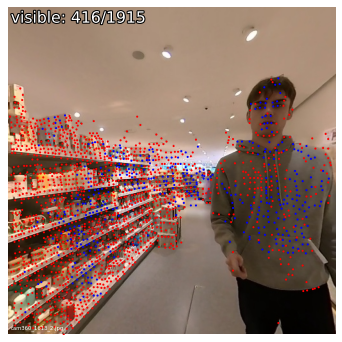

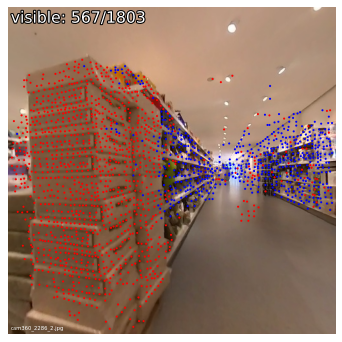

In [20]:
visualization.visualize_sfm_2d(model, images, color_by="visibility", n=2)

In [4]:
for item in images.iterdir():
    print(item)

../../data/0-calibration/images/cam1_100.jpg


In [ ]:
bundle_json = []
# set up rig bundle adjustment json
for item in images.iterdir():
    if item.is_dir():
        bundle_json += {
            item.as_posix.
        }

# Localization
Now that we have a 3D map of the scene, we can localize any image. To demonstrate this, we download [a night-time image from Wikimedia](https://commons.wikimedia.org/wiki/File:Paris_-_Basilique_du_Sacr%C3%A9_Coeur,_Montmartre_-_panoramio.jpg).

In [ ]:
# url = "https://upload.wikimedia.org/wikipedia/commons/5/53/Paris_-_Basilique_du_Sacr%C3%A9_Coeur%2C_Montmartre_-_panoramio.jpg"
# # try other queries by uncommenting their url
# # url = "https://upload.wikimedia.org/wikipedia/commons/5/59/Basilique_du_Sacr%C3%A9-C%C5%93ur_%285430392880%29.jpg"
# # url = "https://upload.wikimedia.org/wikipedia/commons/8/8e/Sacr%C3%A9_C%C5%93ur_at_night%21_%285865355326%29.jpg"
# query = "query/night.jpg"
# !mkdir -p $images/query && wget $url -O $images/$query -q
# plot_images([read_image(images / query)], dpi=75)

Again, we extract features for the query and match them exhaustively.

In [ ]:
query_image

In [21]:
query = 'cam3_100.jpg'

extract_features.main(
    feature_conf, images, image_list=[query], feature_path=features, overwrite=True
)
pairs_from_exhaustive.main(loc_pairs, image_list=[query], ref_list=references)
match_features.main(
    matcher_conf, loc_pairs, features=features, matches=matches, overwrite=True
);

[2024/07/03 16:54:23 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 5000, 'name': 'disk'},
 'output': 'feats-disk',
 'preprocessing': {'grayscale': False, 'resize_max': 1600}}


  0%|          | 0/1 [00:00<?, ?it/s]

[2024/07/03 16:54:23 hloc INFO] Finished exporting features.
[2024/07/03 16:54:23 hloc INFO] Found 183 pairs.
[2024/07/03 16:54:23 hloc INFO] Matching local features with configuration:
{'model': {'features': 'disk', 'name': 'lightglue'},
 'output': 'matches-disk-lightglue'}


  0%|          | 0/183 [00:00<?, ?it/s]

[2024/07/03 16:54:33 hloc INFO] Finished exporting matches.


We read the EXIF data of the query to infer a rough initial estimate of camera parameters like the focal length. Then we estimate the absolute camera pose using PnP+RANSAC and refine the camera parameters.

found 491/1394 inlier correspondences.


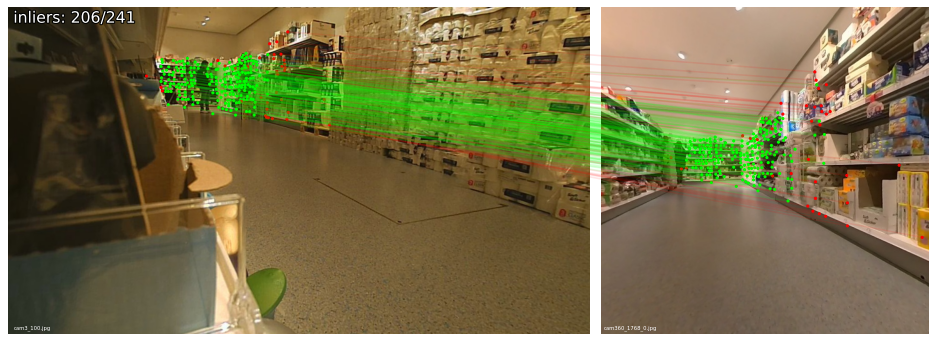

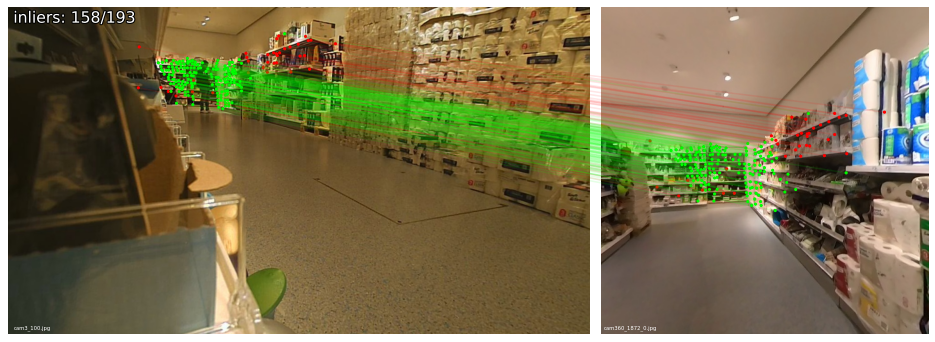

In [29]:
import pycolmap
from hloc.localize_sfm import QueryLocalizer, pose_from_cluster

camera = pycolmap.infer_camera_from_image(images / query)
ref_ids = [model.find_image_with_name(r).image_id for r in references if model.find_image_with_name(r) is not None]
conf = {
    "estimation": {"ransac": {"max_error": 12}},
    "refinement": {"refine_focal_length": True, "refine_extra_params": True},
}
localizer = QueryLocalizer(model, conf)
ret, log = pose_from_cluster(localizer, query, camera, ref_ids, features, matches)

print(f'found {ret["num_inliers"]}/{len(ret["inliers"])} inlier correspondences.')
visualization.visualize_loc_from_log(images, query, log, model)

We visualize the correspondences between the query images a few mapping images. We can also visualize the estimated camera pose in the 3D map.

In [42]:
ret['cam_from_world']

Rigid3d(quat_xyzw=[0.0872501, -0.684289, 0.0273414, 0.723456], t=[-0.0129872, -1.21744, 2.77246])

In [43]:
pose.cam_from_world.inverse().translation

array([-2.85466237,  0.94875839, -0.34588149])

In [34]:
pose

Image(image_id=Invalid, camera_id=Invalid, name="", triangulated=0/0)

In [31]:
pose = pycolmap.Image(cam_from_world=ret["cam_from_world"])
viz_3d.plot_camera_colmap(
    fig, pose, camera, color="rgba(0,255,0,0.5)", name=query, fill=True
)
# visualize 2D-3D correspodences
inl_3d = np.array(
    [model.points3D[pid].xyz for pid in np.array(log["points3D_ids"])[ret["inliers"]]]
)
viz_3d.plot_points(fig, inl_3d, color="lime", ps=1, name=query)
fig.show()

In [2]:
import tqdm, tqdm.notebook

tqdm.tqdm = tqdm.notebook.tqdm  # notebook-friendly progress bars
from pathlib import Path
import numpy as np
import os
import sys
import pycolmap
# Path to the code directory
BASEPATH = os.path.dirname(os.getcwd()).split('code')[-2]
CODEPATH = os.path.join(BASEPATH, 'code')
DATAPATH = os.path.join(BASEPATH, 'data')
sys.path.append(CODEPATH)


from hloc import (
    extract_features,
    match_features,
    reconstruction,
    visualization,
    pairs_from_exhaustive,
)
from hloc.visualization import plot_images, read_image
from hloc.utils import viz_3d
from hloc.localize_sfm import QueryLocalizer, pose_from_cluster

from utils.log_utils import log
from utils.multiview_utils import Camera, Calibration
from utils.metadata_utils import get_cam_names
from configs.arguments import get_config_dict
from utils.io_utils import write_json

images = Path(DATAPATH) / "0-calibration" / "images"
outputs = Path(DATAPATH) / "outputs"
omni_tag = "360"


# define paths to output files
sfm_pairs = outputs / "pairs-sfm.txt"
loc_pairs = outputs / "pairs-loc.txt"
sfm_dir = outputs / "sfm"
features = outputs / "features.h5"
matches = outputs / "matches.h5"

# clear output directory
if not outputs.exists():
    outputs.mkdir()
else:
    for p in outputs.iterdir():
        if p.is_file():
            p.unlink()

# configurations
feature_conf = extract_features.confs["superpoint_aachen"]
matcher_conf = match_features.confs["superpoint+lightglue"]

# reference images (360)
references = [p.relative_to(images).as_posix() for p in (images).iterdir() if omni_tag in p.name]

# extract features
extract_features.main(
    feature_conf, images, image_list=references, feature_path=features
)

# generate pairs
pairs_from_exhaustive.main(sfm_pairs, image_list=references)

# match features
match_features.main(
    matcher_conf, sfm_pairs, features=features, matches=matches
)
opts = dict(camera_model = "SIMPLE_RADIAL")#, camera_params =','.join(map(str, (256, 256, 256, 0))))

model = reconstruction.main(
    sfm_dir, images, sfm_pairs, features, matches, image_list=references, image_options = opts
)
# pose cameras
cams = get_cam_names(images, omni_tag=omni_tag)



[2024/07/03 22:10:32 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-r1024',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}


Loaded SuperPoint model


  0%|          | 0/180 [00:00<?, ?it/s]

[2024/07/03 22:10:38 hloc INFO] Finished exporting features.
[2024/07/03 22:10:38 hloc INFO] Found 16110 pairs.
[2024/07/03 22:10:38 hloc INFO] Matching local features with configuration:
{'model': {'features': 'superpoint', 'name': 'lightglue'},
 'output': 'matches-superpoint-lightglue'}


  0%|          | 0/16110 [00:00<?, ?it/s]

[2024/07/03 22:20:36 hloc INFO] Finished exporting matches.
[2024/07/03 22:20:36 hloc WARNING] The database already exists, deleting it.
[2024/07/03 22:20:36 hloc INFO] Creating an empty database...
[2024/07/03 22:20:37 hloc INFO] Importing images into the database...
[2024/07/03 22:20:39 hloc INFO] Importing features into the database...


  0%|          | 0/180 [00:00<?, ?it/s]

[2024/07/03 22:20:40 hloc INFO] Importing matches into the database...


  0%|          | 0/16110 [00:00<?, ?it/s]

[2024/07/03 22:22:19 hloc INFO] Performing geometric verification of the matches...
I20240703 22:22:19.858155 26207 misc.cc:198] 
Custom feature matching
I20240703 22:22:19.909556 26207 feature_matching.cc:1021] Matching block [1/14]
I20240703 22:22:22.865985 26207 feature_matching.cc:46]  in 2.956s
I20240703 22:22:22.908780 26207 feature_matching.cc:1021] Matching block [2/14]
I20240703 22:22:25.521446 26207 feature_matching.cc:46]  in 2.613s
I20240703 22:22:25.557741 26207 feature_matching.cc:1021] Matching block [3/14]
I20240703 22:22:28.504693 26207 feature_matching.cc:46]  in 2.947s
I20240703 22:22:28.540707 26207 feature_matching.cc:1021] Matching block [4/14]
I20240703 22:22:30.532397 26207 feature_matching.cc:46]  in 1.992s
I20240703 22:22:30.560894 26207 feature_matching.cc:1021] Matching block [5/14]
I20240703 22:22:32.816938 26207 feature_matching.cc:46]  in 2.256s
I20240703 22:22:32.857461 26207 feature_matching.cc:1021] Matching block [6/14]
I20240703 22:22:34.791059 26207

In [10]:
from utils.multiview_utils import Camera, Calibration

In [12]:
cam = cams[0]

camera = Camera(cam, newest=False, data_root =  Path("../../data/"))


TypeError: Camera.__init__() got an unexpected keyword argument 'data_root'

In [6]:
%tb

SystemExit: 2

In [13]:
query = [p.relative_to(images).as_posix() for p in (images).iterdir() if omni_tag not in p.name and cam in p.name][0]
print(query)
camera_colmap = pycolmap.infer_camera_from_image(images / query)

cam1_100.jpg


In [14]:
camera_colmap

Camera(camera_id=Invalid, model=SIMPLE_RADIAL, width=1280, height=720, params=[1536.000000, 640.000000, 360.000000, 0.000000] (f, cx, cy, k))

In [15]:
ref_ids = [model.find_image_with_name(r).image_id for r in references if model.find_image_with_name(r) is not None]

In [16]:
ref_ids

[1,
 2,
 4,
 7,
 8,
 9,
 10,
 13,
 15,
 16,
 19,
 21,
 22,
 25,
 27,
 31,
 33,
 34,
 37,
 39,
 40,
 43,
 45,
 49,
 51,
 55,
 58,
 61,
 62,
 63,
 64,
 67,
 68,
 69,
 70,
 74,
 75,
 76,
 80,
 81,
 82,
 86,
 87,
 88,
 92,
 93,
 94,
 98,
 99,
 100,
 103,
 104,
 105,
 106,
 110,
 111,
 112,
 116,
 117,
 118,
 122,
 123,
 124,
 128,
 129,
 130,
 134,
 135,
 136,
 140,
 141,
 142,
 146,
 147,
 148,
 152,
 153,
 154,
 158,
 159,
 160,
 164,
 165,
 166,
 170,
 171,
 172,
 176,
 177,
 178]

In [21]:
extract_features.main(
    feature_conf, images, image_list=[query], feature_path=features, overwrite=True
)
pairs_from_exhaustive.main(loc_pairs, image_list=[query], ref_list=references)
match_features.main(
    matcher_conf, loc_pairs, features=features, matches=matches, overwrite=True
);

[2024/07/03 22:39:49 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-r1024',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}


Loaded SuperPoint model


  0%|          | 0/1 [00:00<?, ?it/s]

[2024/07/03 22:39:50 hloc INFO] Finished exporting features.
[2024/07/03 22:39:50 hloc INFO] Found 180 pairs.
[2024/07/03 22:39:50 hloc INFO] Matching local features with configuration:
{'model': {'features': 'superpoint', 'name': 'lightglue'},
 'output': 'matches-superpoint-lightglue'}


  0%|          | 0/180 [00:00<?, ?it/s]

[2024/07/03 22:39:58 hloc INFO] Finished exporting matches.


In [22]:
conf = {
            "estimation": {"ransac": {"max_error": 12}},
            "refinement": {"refine_focal_length": True, "refine_extra_params": True},
        }
localizer = QueryLocalizer(model, conf)

In [23]:
ret, log = pose_from_cluster(localizer, query, camera_colmap, ref_ids, features, matches)

In [24]:
ret

{'cam_from_world': Rigid3d(quat_xyzw=[0.0745716, 0.438368, 0.112469, 0.888608], t=[5.03544, -0.19027, 6.86187]),
 'num_inliers': 28,
 'inliers': array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
    

In [ ]:
for cam in cams:
        print(f"Processing camera {cam}")
        camera = Camera(cam, newest=False)      
        query = [p.relative_to(images).as_posix() for p in (images).iterdir() if omni_tag not in p.name and cam in p.name][0]
        print(query)
        camera_colmap = pycolmap.infer_camera_from_image(images / query)
        ref_ids = [model.find_image_with_name(r).image_id for r in references if model.find_image_with_name(r) is not None]
        conf = {
            "estimation": {"ransac": {"max_error": 12}},
            "refinement": {"refine_focal_length": True, "refine_extra_params": True},
        }
        localizer = QueryLocalizer(model, conf)
        ret, log = pose_from_cluster(localizer, query, camera_colmap, ref_ids, features, matches)
        pose = ret['cam_from_world']

        print(f'found {ret["num_inliers"]}/{len(ret["inliers"])} inlier correspondences.')

        camera.set_calib(Calibration(
                R=pose.rotation.matrix(), 
                T=pose.translation, view_id=camera.calibration.view_id, 
                K=camera.calibration.K, 
                K_new=camera.calibration.K_new, 
                dist=camera.calibration.dist,
                size = camera.calibration.size))
        if camera.is_calibrated():
            log.info(f"Camera {cam} calibrated.")
            camera.save_calibration()

if __name__ == '__main__':
    main()